# Initial Exploratory Data Analysis of Audio Files

There are two general classifications of these audio files: 
* firearm discharge sounds
* non-firearm discharge sounds

In this notebook, I will explore the features that are present in the two categories. 

## Import Modules

In [1]:
import pandas as pd
import numpy as np
import librosa
import librosa.display
import os

import matplotlib.pyplot as plt
import matplotlib as mpl

colors=plt.cm.Purples(np.linspace(0,1,num=50))
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=colors)
cmap_seq = ['Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
            'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
            'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn', 
            'afmhot', 'autumn', 'bone', 'cool', 'copper',
            'gist_heat', 'gray', 'hot', 'pink','spring', 'summer', 
            'winter', 'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 
            'Reds','YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
            'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn', 'afmhot', 
            'autumn']

mpl.rcParams.update({'figure.max_open_warning': 0})

## Data from ESC50

The ESC50 file is from the Environmental Sound Classification project: https://github.com/karolpiczak/ESC-50
* There are 50 categories
* Each category has 40 associated sound clips
* Thus, there are 2000 labeled sound clips

In [6]:
os.chdir(path='..')
os.getcwd()

'/Users/aarojas/Documents/Data_Science_Resources/Insight_20B/AAR_Insight_Project/Firearm_Detection'

Navigate to the .csv file where the details on the audio labeling are indicated. 

In [7]:
os.chdir(path='data/raw/ESC-50-master/meta')

Read the .csv file

In [8]:
esc50=pd.read_csv('esc50.csv',sep=',')
esc50

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A
...,...,...,...,...,...,...,...
1995,5-263831-B-6.wav,5,6,hen,False,263831,B
1996,5-263902-A-36.wav,5,36,vacuum_cleaner,False,263902,A
1997,5-51149-A-25.wav,5,25,footsteps,False,51149,A
1998,5-61635-A-8.wav,5,8,sheep,False,61635,A


View the categories

In [11]:
esc50bycategory=esc50.groupby(['category'])
esc50_categories=[]
for name, group in esc50bycategory:
    esc50_categories.append(name)
import pprint
pprint.pprint(esc50_categories)
print('\nThe number of categories are',len(esc50bycategory))

['airplane',
 'breathing',
 'brushing_teeth',
 'can_opening',
 'car_horn',
 'cat',
 'chainsaw',
 'chirping_birds',
 'church_bells',
 'clapping',
 'clock_alarm',
 'clock_tick',
 'coughing',
 'cow',
 'crackling_fire',
 'crickets',
 'crow',
 'crying_baby',
 'dog',
 'door_wood_creaks',
 'door_wood_knock',
 'drinking_sipping',
 'engine',
 'fireworks',
 'footsteps',
 'frog',
 'glass_breaking',
 'hand_saw',
 'helicopter',
 'hen',
 'insects',
 'keyboard_typing',
 'laughing',
 'mouse_click',
 'pig',
 'pouring_water',
 'rain',
 'rooster',
 'sea_waves',
 'sheep',
 'siren',
 'sneezing',
 'snoring',
 'thunderstorm',
 'toilet_flush',
 'train',
 'vacuum_cleaner',
 'washing_machine',
 'water_drops',
 'wind']

The number of categories are 50


In [10]:
ESC50filenames=esc50['filename']

## Using Librosa

In [7]:
os.chdir(path='..')
os.getcwd()

'/Users/aarojas/Documents/Data_Science_Resources/Insight_20B/AAR_Insight_Project/Firearm_Detection/data/raw/ESC-50-master'

In [8]:
os.chdir(path='audio')

## MFCC
With librosa, I can do some feature extraction of the audio files. 
For example, a feature called Mel-frequency cepstral coefficients (MFCC) can be extracted.  

In [26]:
mfcc_nonfa=pd.DataFrame() # empty dataframe for mfcc values of non firearm sounds
for filename in ESC50filenames:
    x,sr=librosa.load(filename)     
    #
    mfcc_vals=librosa.feature.mfcc(x)
    #
    mfcc_vals_df=pd.DataFrame(mfcc_vals[0]) # the 0th row contains nonzero values
    mfcc_nonfa=pd.concat([mfcc_nonfa,mfcc_vals_df],axis=1)
mfcc_nonfa.columns=list(ESC50filenames)

Visualize what this **mfcc_nonfa** dataframe looks like. 

In [27]:
mfcc_nonfa

,1-100032-A-0.wav,1-100038-A-14.wav,1-100210-A-36.wav,1-100210-B-36.wav,1-101296-A-19.wav,1-101296-B-19.wav,1-101336-A-30.wav,1-101404-A-34.wav,1-103298-A-9.wav,1-103995-A-30.wav,...,5-263491-A-25.wav,5-263501-A-25.wav,5-263775-A-26.wav,5-263775-B-26.wav,5-263831-A-6.wav,5-263831-B-6.wav,5-263902-A-36.wav,5-51149-A-25.wav,5-61635-A-8.wav,5-9032-A-0.wav
0,-629.032654,-160.357819,-61.090450,24.534575,-441.500702,-459.569641,-483.970490,-628.323364,-73.447479,-134.148880,...,-254.267441,-363.506989,-262.741302,-212.966492,-248.303467,-308.379517,-42.024166,-119.380623,-9.255802,-540.630310
1,-629.032654,-166.974304,-67.881874,26.044210,-439.200562,-459.540344,-487.555023,-626.833374,-87.073051,-49.687943,...,-242.731766,-358.339783,-275.647247,-219.057144,-237.029877,-306.409302,-43.844368,-108.521347,-19.421188,-450.491058
2,-629.032654,-179.697693,-76.051483,25.130634,-437.821472,-460.351715,-349.589233,-516.471924,-117.744873,-64.646469,...,-221.557037,-360.556641,-291.024109,-190.285431,-230.973679,-305.119720,-48.024822,-111.106140,-32.814114,-238.432724
3,-629.032654,-192.313965,-73.610291,22.185335,-428.792053,-457.058777,-127.547989,-168.906769,-120.422325,-217.138229,...,-187.438644,-359.737823,-217.188675,-109.634315,-203.037048,-301.512695,-47.419777,-84.251678,-41.824875,-142.344635
4,-629.032654,-205.075073,-58.374516,21.167458,-427.495209,-455.690491,-98.918190,-115.864349,-126.846642,-369.172302,...,-197.956009,-362.437225,-168.321548,-73.968155,-183.520508,-303.346558,-49.797543,-72.310684,-73.085747,-103.715355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,-629.032654,-201.716278,17.278660,-47.790462,-445.981628,-407.349213,-591.598206,-552.837341,-4.394466,-639.827332,...,-292.071106,-388.498291,-393.679291,-424.903015,-104.196548,-115.979568,-52.716511,-496.349670,-151.412155,-600.496277
212,-629.032654,-202.370514,20.953020,-51.411175,-443.614075,-407.517792,-591.598206,-548.412292,-7.788163,-639.827332,...,-318.953094,-388.169342,-373.951447,-425.412689,-165.476273,-171.755692,-54.469849,-496.349670,-151.863678,-600.496277
213,-629.032654,-205.099701,30.638668,-53.498665,-442.716034,-414.561462,-591.598206,-531.583374,-23.959036,-639.827332,...,-384.348877,-387.247040,-378.163788,-421.299774,-217.790009,-248.200241,-51.593639,-496.349670,-151.909546,-600.496277
214,-629.032654,-195.676392,26.986601,-55.822437,-439.670227,-416.130005,-591.598206,-529.392822,-54.325924,-639.827332,...,-416.386139,-387.809967,-372.849396,-413.523071,-233.073242,-281.436676,-52.331711,-496.349670,-149.222183,-600.496277


In [67]:
c=0
for color in cmap_seq:
    mfcc_nonfa[ESC50filenames[c*40:40*(c+1)]].plot(legend=False,figsize=(8,5),fontsize=15,colormap=color);
    plt.title(esc50_categories[c],fontsize=15);
    plt.axis([-20,240,-1000,200])
    c+=1
    plt.close()

## RMS
Calculating the root mean square for each frame from the audio samples. 
The default frame_length is used (frame_length=2048). 

In [72]:
rms_nonfa=pd.DataFrame() # empty dataframe for mfcc values of non firearm sounds
for filename in ESC50filenames:
    x,sr=librosa.load(filename)     
    #
    rms_vals=librosa.feature.rms(x)
    #
    rms_vals_df=pd.DataFrame(rms_vals).T # the 0th row contains nonzero values
    rms_nonfa=pd.concat([rms_nonfa,rms_vals_df],axis=1)
rms_nonfa.columns=list(ESC50filenames)

In [73]:
rms_nonfa

,1-100032-A-0.wav,1-100038-A-14.wav,1-100210-A-36.wav,1-100210-B-36.wav,1-101296-A-19.wav,1-101296-B-19.wav,1-101336-A-30.wav,1-101404-A-34.wav,1-103298-A-9.wav,1-103995-A-30.wav,...,5-263491-A-25.wav,5-263501-A-25.wav,5-263775-A-26.wav,5-263775-B-26.wav,5-263831-A-6.wav,5-263831-B-6.wav,5-263902-A-36.wav,5-51149-A-25.wav,5-61635-A-8.wav,5-9032-A-0.wav
0,0.0,0.193702,0.178528,0.335712,0.003425,0.002325,0.002335,0.002356,0.290884,0.207905,...,0.013417,0.006962,0.012719,0.042130,0.023180,0.010913,0.106217,0.090329,0.323470,6.617947e-04
1,0.0,0.185784,0.181634,0.334075,0.003335,0.002352,0.002358,0.001980,0.262685,0.152758,...,0.018182,0.006796,0.012000,0.113313,0.023441,0.011160,0.106203,0.085837,0.308948,2.816293e-02
2,0.0,0.182016,0.160223,0.327644,0.003284,0.002302,0.171708,0.076001,0.254046,0.154735,...,0.020506,0.006863,0.066135,0.168869,0.031509,0.011252,0.106100,0.129638,0.283156,1.881396e-01
3,0.0,0.176445,0.140849,0.321929,0.004333,0.002501,0.227590,0.078885,0.253259,0.161466,...,0.023027,0.006847,0.129879,0.222352,0.037478,0.011001,0.107633,0.183311,0.237019,2.787879e-01
4,0.0,0.127753,0.149799,0.313855,0.004477,0.002634,0.236672,0.079228,0.195003,0.087238,...,0.022730,0.006560,0.158687,0.278873,0.038781,0.011842,0.108268,0.194857,0.170985,3.288603e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,0.0,0.023653,0.263106,0.132908,0.004214,0.007832,0.000000,0.000678,0.175437,0.000000,...,0.014308,0.005088,0.024349,0.002444,0.108999,0.071179,0.114209,0.000000,0.048130,3.953866e-08
212,0.0,0.024608,0.267957,0.137156,0.003933,0.007808,0.000000,0.000675,0.174491,0.000000,...,0.007075,0.005039,0.033138,0.002638,0.101759,0.066177,0.116416,0.000000,0.047516,0.000000e+00
213,0.0,0.026474,0.270972,0.139245,0.003474,0.007994,0.000000,0.000680,0.159286,0.000000,...,0.005305,0.005065,0.039000,0.002719,0.054317,0.041842,0.115088,0.000000,0.043690,0.000000e+00
214,0.0,0.027584,0.267844,0.140324,0.002901,0.007828,0.000000,0.000639,0.128386,0.000000,...,0.003675,0.005326,0.041463,0.002658,0.027821,0.017300,0.112550,0.000000,0.042592,0.000000e+00


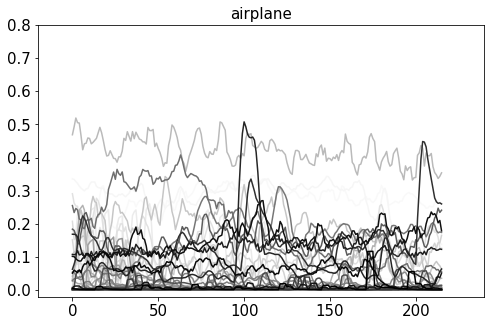

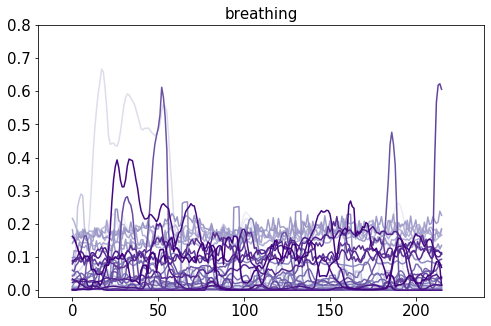

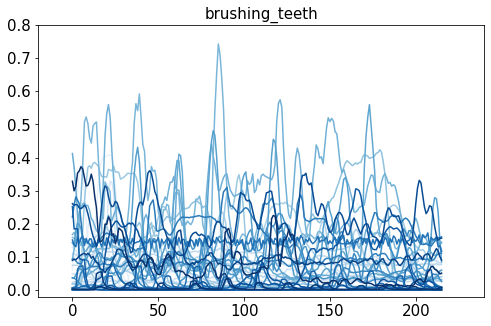

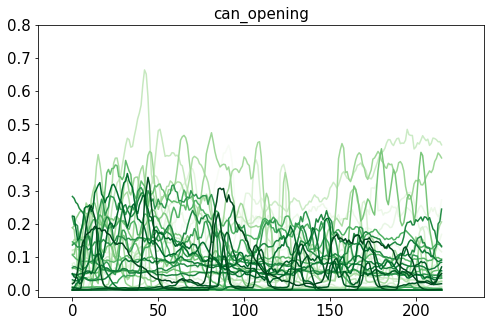

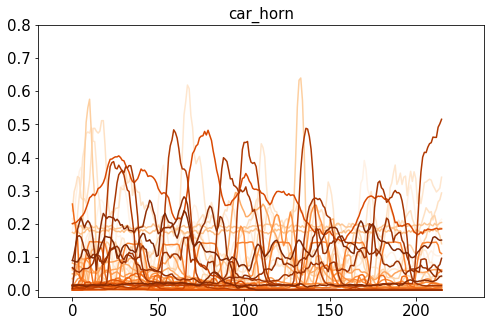

...

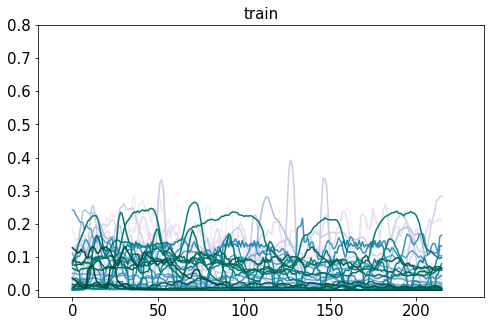

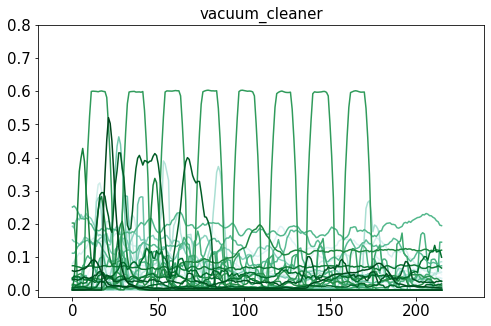

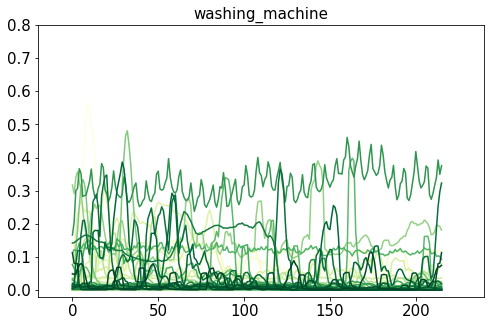

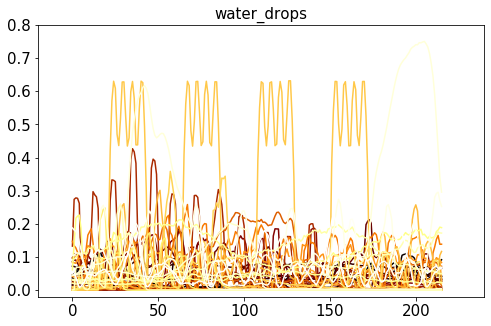

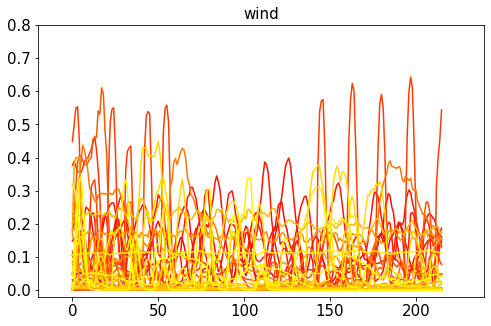

In [76]:
c=0
for color in cmap_seq:
    rms_nonfa[ESC50filenames[c*40:40*(c+1)]].plot(legend=False,figsize=(8,5),fontsize=15,colormap=color);
    plt.title(esc50_categories[c],fontsize=15);
    plt.axis([-20,240,-.02,.8])
    c+=1
    #plt.close()

## Spectral Flatness
According to the librosa documentation, this feature is a measurement to help quantify how noise-like a sound is as opposed to being tone-like. 

In [81]:
specflat_nonfa=pd.DataFrame() # empty dataframe for mfcc values of non firearm sounds
for filename in ESC50filenames:
    x,sr=librosa.load(filename)     
    #
    specflat_vals=librosa.feature.spectral_flatness(x)
    #
    specflat_vals_df=pd.DataFrame(specflat_vals).T #
    specflat_nonfa=pd.concat([specflat_nonfa,specflat_vals_df],axis=1)
specflat_nonfa.columns=list(ESC50filenames)

In [82]:
specflat_nonfa

,1-100032-A-0.wav,1-100038-A-14.wav,1-100210-A-36.wav,1-100210-B-36.wav,1-101296-A-19.wav,1-101296-B-19.wav,1-101336-A-30.wav,1-101404-A-34.wav,1-103298-A-9.wav,1-103995-A-30.wav,...,5-263491-A-25.wav,5-263501-A-25.wav,5-263775-A-26.wav,5-263775-B-26.wav,5-263831-A-6.wav,5-263831-B-6.wav,5-263902-A-36.wav,5-51149-A-25.wav,5-61635-A-8.wav,5-9032-A-0.wav
0,0.0,0.193702,0.178528,0.335712,0.003425,0.002325,0.002335,0.002356,0.290884,0.207905,...,0.013417,0.006962,0.012719,0.042130,0.023180,0.010913,0.106217,0.090329,0.323470,6.617947e-04
1,0.0,0.185784,0.181634,0.334075,0.003335,0.002352,0.002358,0.001980,0.262685,0.152758,...,0.018182,0.006796,0.012000,0.113313,0.023441,0.011160,0.106203,0.085837,0.308948,2.816293e-02
2,0.0,0.182016,0.160223,0.327644,0.003284,0.002302,0.171708,0.076001,0.254046,0.154735,...,0.020506,0.006863,0.066135,0.168869,0.031509,0.011252,0.106100,0.129638,0.283156,1.881396e-01
3,0.0,0.176445,0.140849,0.321929,0.004333,0.002501,0.227590,0.078885,0.253259,0.161466,...,0.023027,0.006847,0.129879,0.222352,0.037478,0.011001,0.107633,0.183311,0.237019,2.787879e-01
4,0.0,0.127753,0.149799,0.313855,0.004477,0.002634,0.236672,0.079228,0.195003,0.087238,...,0.022730,0.006560,0.158687,0.278873,0.038781,0.011842,0.108268,0.194857,0.170985,3.288603e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,0.0,0.023653,0.263106,0.132908,0.004214,0.007832,0.000000,0.000678,0.175437,0.000000,...,0.014308,0.005088,0.024349,0.002444,0.108999,0.071179,0.114209,0.000000,0.048130,3.953866e-08
212,0.0,0.024608,0.267957,0.137156,0.003933,0.007808,0.000000,0.000675,0.174491,0.000000,...,0.007075,0.005039,0.033138,0.002638,0.101759,0.066177,0.116416,0.000000,0.047516,0.000000e+00
213,0.0,0.026474,0.270972,0.139245,0.003474,0.007994,0.000000,0.000680,0.159286,0.000000,...,0.005305,0.005065,0.039000,0.002719,0.054317,0.041842,0.115088,0.000000,0.043690,0.000000e+00
214,0.0,0.027584,0.267844,0.140324,0.002901,0.007828,0.000000,0.000639,0.128386,0.000000,...,0.003675,0.005326,0.041463,0.002658,0.027821,0.017300,0.112550,0.000000,0.042592,0.000000e+00


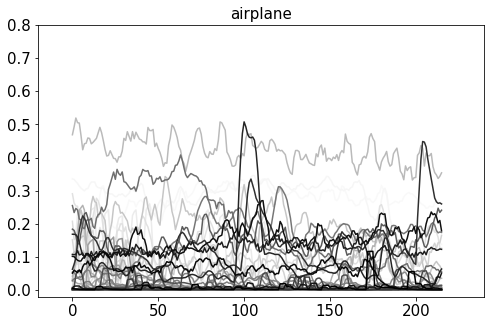

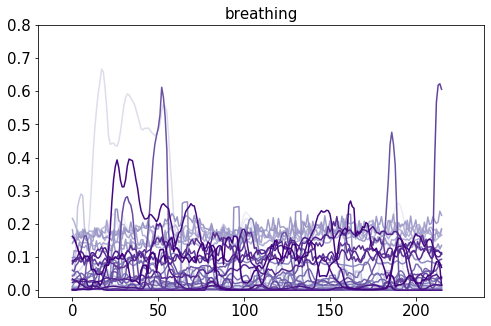

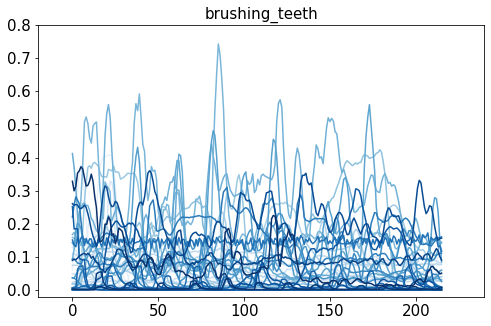

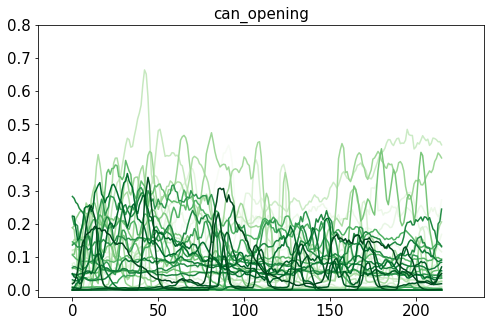

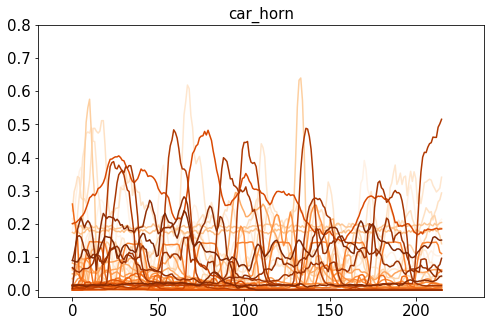

...

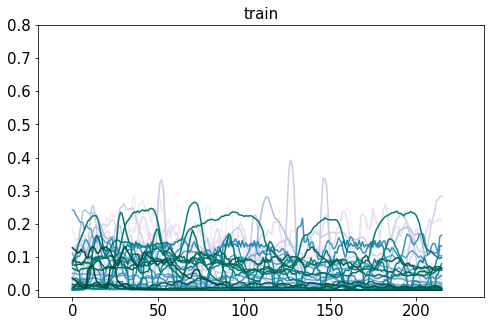

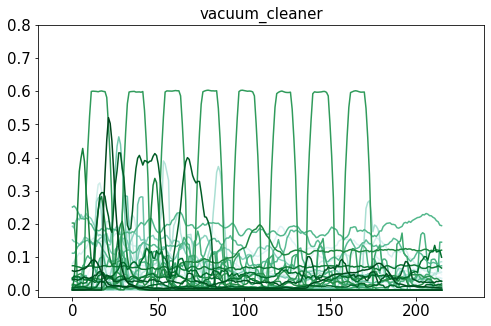

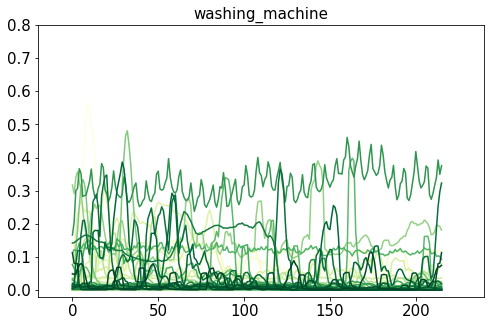

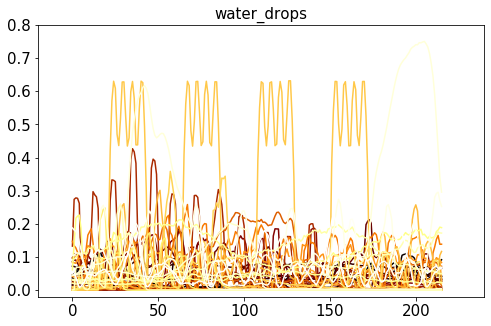

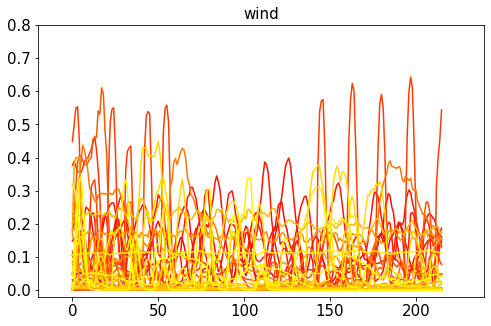

In [84]:
c=0
for color in cmap_seq:
    specflat_nonfa[ESC50filenames[c*40:40*(c+1)]].plot(legend=False,figsize=(8,5),fontsize=15,colormap=color);
    plt.title(esc50_categories[c],fontsize=15);
    plt.axis([-20,240,-.02,.8])
    c+=1
    #plt.close()

There's a lot going on in these graphs, and it's not very intuitive to see which audio files may be of interest. In the next notebook, I'll look at this in a different manner... 